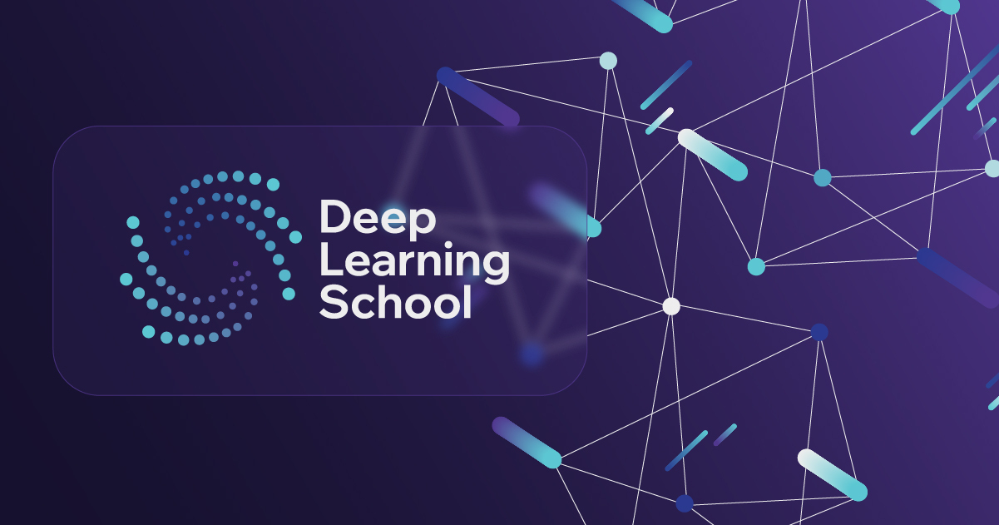

<h3 style="text-align: center;"><b>Школа глубокого обучения ФПМИ МФТИ</b></h3>

<h3 style="text-align: center;"><b>Семинар. Введение в аудио</b></h3>


В этом семинаре вы познакомитесь с основными библиотеками для работы с аудио данными, такими как librosa, torchaudio и soundfile. Также мы рассмотрим базовые характеристики волн, как амплитуда, частота, фаза.

In [1]:
# !pip uninstall -y torchaudio torch librosa
# !pip install torch torchaudio librosa
# !pip install audiomentations

In [2]:
# !pip install "numpy<2" --force-reinstall --no-cache-dir

In [3]:
import torchaudio

In [4]:
import librosa
from IPython.display import Audio
path_to_save = 'content'
import numpy as np
import matplotlib.pyplot as plt

import warnings

# Ignore all warnings
warnings.filterwarnings("ignore")

## Simple example: sine wave

$$ y = A \cdot \sin(2\pi \omega t)$$

$A$ - amplitude, $\omega$ - frequency

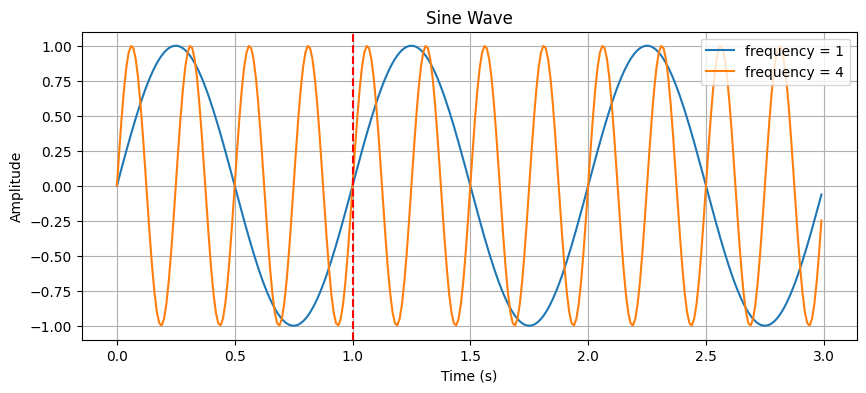

In [5]:
import numpy as np
import matplotlib.pyplot as plt

# Time parameters
duration = 3  # seconds
sample_rate = 100 # sampling rate (samples/second)
t = np.linspace(0, duration, int(sample_rate * duration), endpoint=False)

# Signal parameters
frequency1 = 1  # Hz
amplitude1 = 1

frequency2 = 4  # Hz
amplitude2 = 1

# Generate sine wave
sine_wave = amplitude1 * np.sin(2 * np.pi * frequency1 * t)
sine_wave2 = amplitude2 * np.sin(2 * np.pi * frequency2 * t)

# Plot
fig, ax = plt.subplots(figsize=(10, 4))

ax.plot(t, sine_wave, label=f'frequency = {frequency1}')
ax.plot(t, sine_wave2, label=f'frequency = {frequency2}')
ax.axvline(x=1.0, color='r', linestyle="--")

plt.title(f'Sine Wave')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.grid(True)
plt.legend()
plt.savefig(f"{path_to_save}/amplitude_2.png")
plt.show()

## Intro to librosa, torchaudio, soundfile.

### 1. Audio Loading and Basic I/O

Давайте познакомимся с библиотеками librosa, torchaudio и soundfile.

Audio data shape: (117601,)
Sample rate: 22050


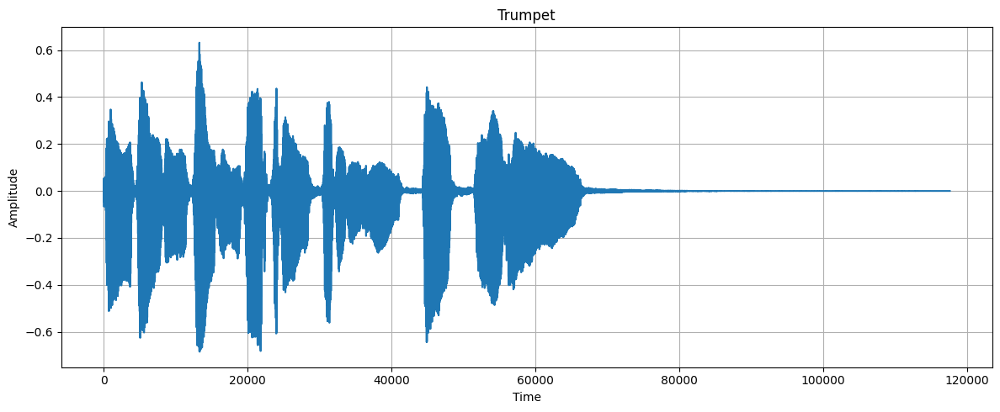

In [6]:
import librosa

# Load an example audio file (e.g., a trumpet sound)
wav, sr = librosa.load(librosa.ex('trumpet'))

print(f"Audio data shape: {wav.shape}")
print(f"Sample rate: {sr}")
display(Audio(data=wav, rate=sr))

# Plot with time axis
plt.figure(figsize=(12, 5))
plt.plot(wav)
plt.title('Trumpet')
plt.xlabel('Time')
plt.ylabel('Amplitude')
plt.grid(True)
plt.tight_layout()
plt.show()

Давайте сохраним эту скачанную аудиозапись в wav файл.

Для сохранения аудиоданных, обработанных с помощью librosa, в файл WAV рекомендуется использовать библиотеку `soundfile`, поскольку `librosa.output.write_wav` устарела с версии librosa 0.7 и удалена в версии 0.8.

In [7]:
import soundfile as sf

output_path = 'trumpet_audio.wav'

# Save the audio data to a WAV file using soundfile
sf.write(output_path, wav, sr, format='WAV')

Давайте загрузим `wav`- файл при помощи librosa.

По умолчанию `librosa.load()` передискретизирует аудиосигнал до частоты 22050 Гц и преобразует его в моно (одноканальный). Установка `sr=None` сохраняет исходную частоту дискретизации.

In [8]:
# Specify the path to your WAV file
audio_file_path = 'content/trumpet_audio.wav'

# Load the audio file
# By default, librosa resamples the audio to 22050 Hz and converts to mono.
wav, sr = librosa.load(audio_file_path)
print(f'wav.shape = {wav.shape}')
print(f'sample rate = {sr}')

# If you want to preserve the native sampling rate of the file, use sr=None:
wav, sr = librosa.load(audio_file_path, sr=None)

print(f'wav.shape = {wav.shape}')
print(f'sample rate = {sr}')

wav.shape = (117601,)
sample rate = 22050
wav.shape = (117601,)
sample rate = 22050


Давайте сразу познакомимся с библиотекой `torchaudio`.

`torchaudio` — это toolkit на основе PyTorch для всех задач, связанных со звуком: от загрузки и предварительной обработки данных до работы с речью, музыкой и другими звуковыми файлами.

In [9]:
# !pip install --upgrade torchcodec

In [10]:
# !pip install matplotlib==3.10.0

In [11]:
# !pip install "numpy<2" --force-reinstall

In [12]:
import matplotlib
import pandas as pd
import numpy as np
import torch
import audiomentations
print(matplotlib.__version__)
print(pd.__version__)
print(np.__version__)
print(torch.__version__)
print(torchaudio.__version__)
print(librosa.__version__)
print(sf.__version__)
print(audiomentations.__version__)
# 3.10.0
# 2.2.2
# 1.26.4
# 2.10.0+cpu
# 2.10.0+cpu
# 0.11.0
# 0.13.1
# 0.43.1

3.10.0
2.2.2
1.26.4
2.10.0+cpu
2.10.0+cpu
0.11.0
0.13.1
0.43.1


In [13]:
# !pip uninstall torchaudio torchcodec -y
# !pip install torchaudio torchcodec

In [14]:
# conda install -c conda-forge ffmpeg

In [15]:
import os
import sys

# Добавляем FFmpeg в PATH для текущей сессии
ffmpeg_bin = r'C:\ffmpeg\bin'
if os.path.exists(ffmpeg_bin):
    os.environ['PATH'] = ffmpeg_bin + os.pathsep + os.environ['PATH']
    print(f"✓ FFmpeg path added: {ffmpeg_bin}")
    
    # Проверяем, что FFmpeg теперь доступен
    !ffmpeg -version
else:
    print(f"✗ FFmpeg not found at {ffmpeg_bin}")
    print("Please extract FFmpeg to C:\\ffmpeg first")

✓ FFmpeg path added: C:\ffmpeg\bin
ffmpeg version N-123586-g711b1a52bd-20260322 Copyright (c) 2000-2026 the FFmpeg developers
built with gcc 15.2.0 (crosstool-NG 1.28.0.23_185f348)
configuration: --prefix=/ffbuild/prefix --pkg-config-flags=--static --pkg-config=pkg-config --cross-prefix=x86_64-w64-mingw32- --arch=x86_64 --target-os=mingw32 --enable-gpl --enable-version3 --disable-debug --enable-shared --disable-static --disable-w32threads --enable-pthreads --enable-iconv --enable-zlib --enable-libxml2 --enable-libvmaf --enable-fontconfig --enable-libharfbuzz --enable-libfreetype --enable-libfribidi --enable-vulkan --enable-libshaderc --enable-libvorbis --disable-libxcb --disable-xlib --disable-libpulse --enable-opencl --enable-gmp --enable-lzma --enable-liblcevc-dec --enable-amf --enable-libaom --enable-libaribb24 --enable-avisynth --enable-chromaprint --enable-libdav1d --enable-libdavs2 --enable-libdvdread --enable-libdvdnav --disable-libfdk-aac --enable-ffnvcodec --enable-cuda-llvm -

In [16]:
import torchaudio

# Define the path to your WAV file
audio_file_path = 'content/trumpet_audio.wav'

# Load the audio file
wav, sr = torchaudio.load(audio_file_path)

# Print information about the loaded audio
print(f"Waveform shape: {wav.shape}")
print(f"Sample rate: {sr} Hz")
print(f"Waveform dtype: {wav.dtype}")

Waveform shape: torch.Size([1, 117601])
Sample rate: 22050 Hz
Waveform dtype: torch.float32


Как сохранить аудиофайл в `torchaudio`:

In [17]:
# Define the path for the output WAV file
output_path = "content/trumpet_audio.wav"

# Save the waveform to a WAV file
torchaudio.save(output_path, wav, sr)

Давайте посмотрим на человеческую речь и то как она выглядит.

Также скачаем из библиотеки `librosa` аудиозапись из датасета Librispeech.

Audio data shape: (327222,)
Sample rate: 22050


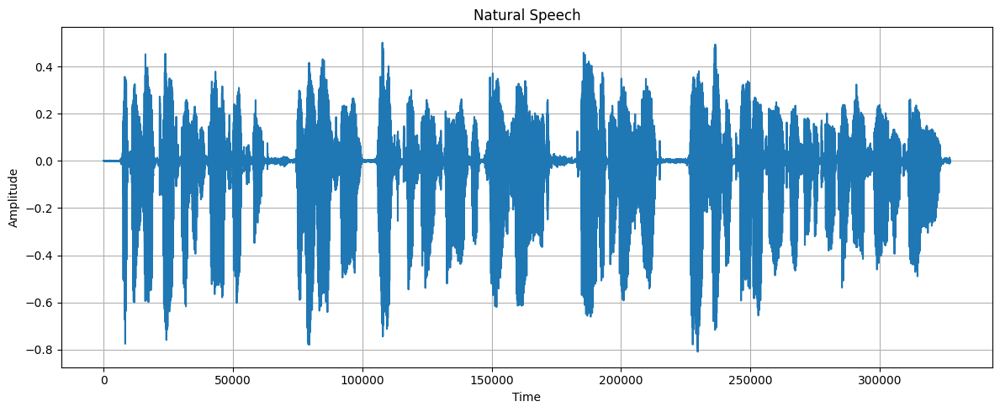

In [18]:
import librosa

# Load an example audio file (e.g., Librispeech sample) libri1
wav, sr = librosa.load(librosa.ex('libri1'))

print(f"Audio data shape: {wav.shape}")
print(f"Sample rate: {sr}")

display(Audio(data=wav, rate=sr))

# Plot with time axis
plt.figure(figsize=(12, 5))
plt.plot(wav)
plt.title('Natural Speech')
plt.xlabel('Time')
plt.ylabel('Amplitude')
plt.grid(True)
plt.tight_layout()
plt.show()

Давайте для удобства отобразим время в секундах.

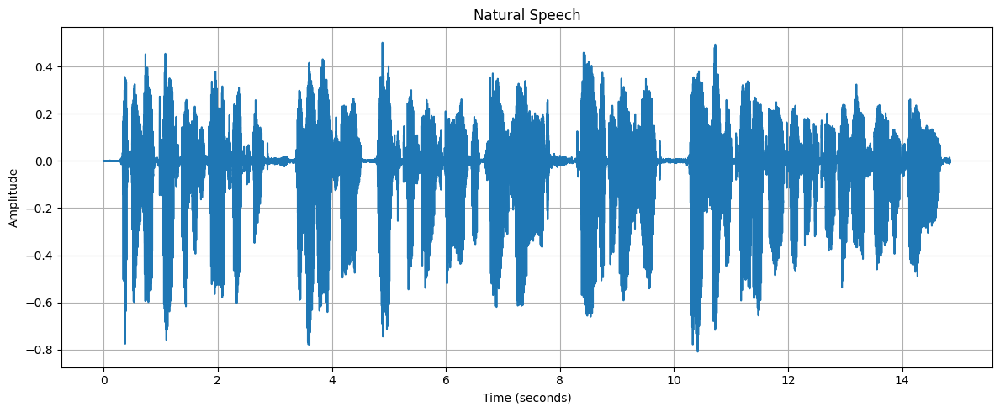

In [19]:
import librosa
import librosa.display
import matplotlib.pyplot as plt

# Load the audio file with a specific sampling rate
wav, sr = librosa.load(librosa.ex('libri1'), sr=None)  # sr=None preserves native rate :cite[1]

# Create time array for x-axis
duration = len(wav) / sr
time = np.linspace(0, duration, len(wav))

# Plot with time axis
plt.figure(figsize=(12, 5))
plt.plot(time, wav)
plt.title('Natural Speech')
plt.xlabel('Time (seconds)')
plt.ylabel('Amplitude')
plt.grid(True)
plt.tight_layout()
plt.show()

In [20]:
import soundfile as sf

output_path = 'speech.wav'

# Save the audio data to a WAV file using soundfile
sf.write(output_path, wav, sr, format='WAV')

### 2. Visualization: Waveform

`Librosa` интегрируется с Matplotlib для отображения.

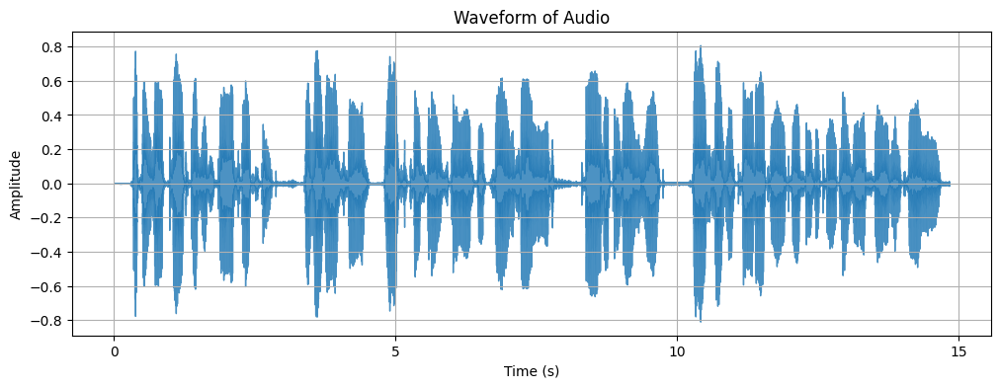

In [21]:
audio_file_path = 'speech.wav'
wav, sr = librosa.load(audio_file_path, sr=None)

plt.figure(figsize=(12, 4))
librosa.display.waveshow(wav, sr=sr, alpha=0.8)  # Updated from `waveplot`
plt.title("Waveform of Audio")
plt.xlabel("Time (s)")
plt.ylabel("Amplitude")
plt.grid(True)
plt.show()

В `torchaudio` нет встроенной функции отрисовки, поэтому мы просто можем воспользоваться `matplotlib`.

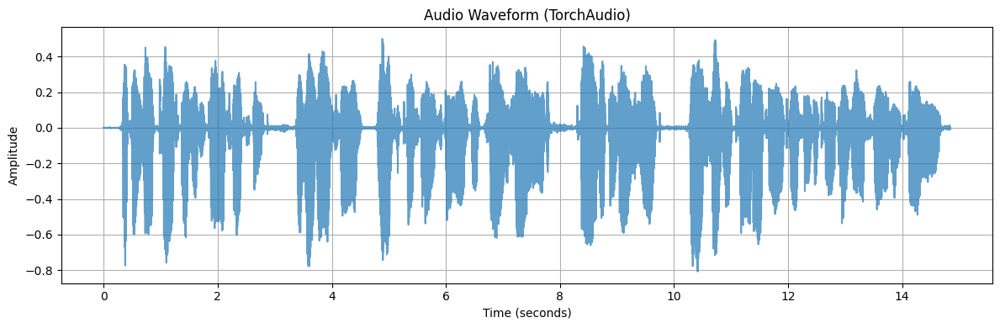

In [22]:
import torch
import torchaudio

# Load audio
wav, sr = torchaudio.load('speech.wav')  # Replace with your file

# Convert to mono if stereo
if wav.shape[0] > 1:
    wav = torch.mean(wav, dim=0, keepdim=True)

# Create time axis
t = torch.arange(0, wav.shape[1]) / sr

# Plot waveform
plt.figure(figsize=(12, 4))
plt.plot(t, wav[0].numpy(), alpha=0.7)
plt.title('Audio Waveform (TorchAudio)')
plt.xlabel('Time (seconds)')
plt.ylabel('Amplitude')
plt.grid()
plt.tight_layout()
plt.show();

### 2. Audio Preprocessing and Transformation

#### librosa

In [23]:
# pip install soxr or pip install resampy

(327222,)
22050


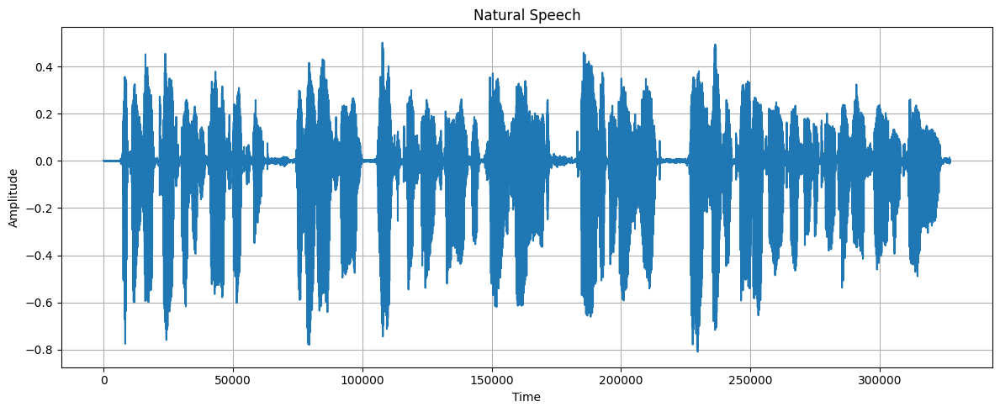

In [24]:
audio_file_path = 'speech.wav'
wav, sr = librosa.load(audio_file_path, sr=None)

print(wav.shape)
print(sr)

display(Audio(data=wav, rate=sr))

# Plot with time axis
plt.figure(figsize=(12, 5))
plt.plot(wav)
plt.title('Natural Speech')
plt.xlabel('Time')
plt.ylabel('Amplitude')
plt.grid(True)
plt.tight_layout()
plt.show()

(237440,)


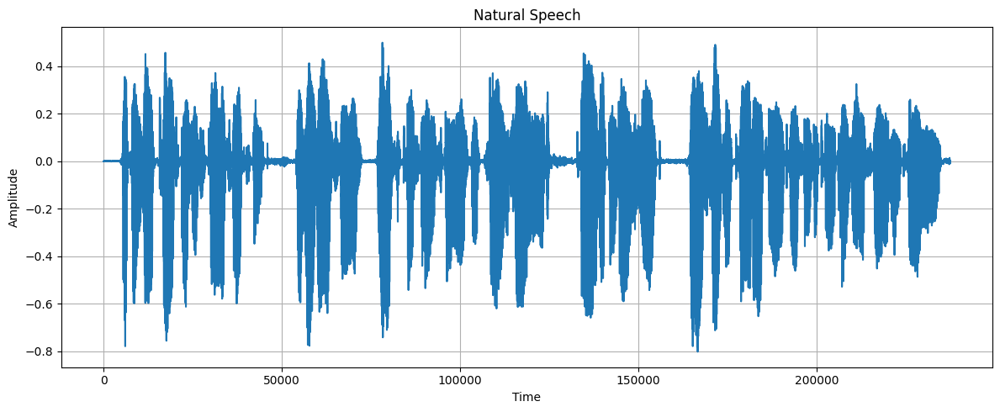

In [25]:
# resampling
target_sr = 16000
wav_resampled = librosa.resample(wav, orig_sr=sr, target_sr=target_sr, res_type='soxr_hq')
print(wav_resampled.shape)

display(Audio(data=wav_resampled, rate=target_sr))

# Plot with time axis
plt.figure(figsize=(12, 5))
plt.plot(wav_resampled)
plt.title('Natural Speech')
plt.xlabel('Time')
plt.ylabel('Amplitude')
plt.grid(True)
plt.tight_layout()
plt.show()

In [26]:
# Time-stretching: Speed up (1.5x) or slow down (0.7x)
wav_fast = librosa.effects.time_stretch(wav, rate=1.5)
wav_slow = librosa.effects.time_stretch(wav, rate=0.7)

print("Original sound")
display(Audio(data=wav, rate=sr))
print("Speed up (1.5x)")
display(Audio(data=wav_fast, rate=sr))
print("Slow down (0.7x)")
display(Audio(data=wav_slow, rate=sr))

# Pitch-shifting: Shift up by 4 semitones or down by 5 semitones
wav_higher_pitch = librosa.effects.pitch_shift(wav, sr=sr, n_steps=4)
wav_lower_pitch = librosa.effects.pitch_shift(wav, sr=sr, n_steps=-5)

print("Pitch-shift up by 4 semitones")
display(Audio(data=wav_higher_pitch, rate=sr))
print("Pitch-shift down by 5 semitones")
display(Audio(data=wav_lower_pitch, rate=sr))

Original sound


Speed up (1.5x)


Slow down (0.7x)


Pitch-shift up by 4 semitones


Pitch-shift down by 5 semitones


#### Torchaudio

1. **Stereo --> Mono**

In [27]:
import torch
import torchaudio

# Load audio
wav, sr = torchaudio.load('speech.wav')  # Replace with your file

# Convert to mono if stereo
if wav.shape[0] > 1:
    wav = torch.mean(wav, dim=0, keepdim=True)

2. **Resample**

In [28]:
import torchaudio.transforms as T
import torchaudio.functional as F

print(wav.shape)
print(f'Original sample rate = {sr}')

# Approach 1
# Resample from original sample_rate to 16000 Hz
resampler = T.Resample(orig_freq=sr, new_freq=16000)
wav_resampled = resampler(wav)
print(wav_resampled.shape)

# Approach 2
wav_resampled = F.resample(wav, sr, 16000)
print(wav_resampled.shape)

torch.Size([1, 327222])
Original sample rate = 22050
torch.Size([1, 237440])
torch.Size([1, 237440])


3. `torchaudio.transforms`

Вы можете более подробно прочитать какой есть функционал у `torchaudio.transforms` по этой ссылке в [документации](https://docs.pytorch.org/audio/stable/transforms).

3.1. **Fade**

Нарастание звука (fade-in) создает плавный переход от тишины или низкой громкости, в то время как затухание (fade-out) создает плавное завершение к тишине или низкой громкости.

In [29]:
wav, sr = torchaudio.load("speech.wav", normalize=True)
transform = T.Fade(fade_in_len=sr, fade_out_len=2 * sr, fade_shape="linear")
faded_waveform = transform(wav)

print(f"Audio data shape: {wav.shape}")
print(f"Sample rate: {sr}")

display(Audio(data=wav, rate=sr))

display(Audio(data=faded_waveform, rate=sr))

Audio data shape: torch.Size([1, 327222])
Sample rate: 22050


3.2. **Volume**

Регулирует громкость сигнала.

In [30]:
wav, sr = torchaudio.load("speech.wav", normalize=True)
transform = T.Vol(gain=10.0, gain_type="db")
lauder_waveform = transform(wav)

display(Audio(data=wav, rate=sr))

display(Audio(data=lauder_waveform, rate=sr))

3.3. **Speed**

In [31]:
# Load an audio file (example)
waveform, sample_rate = torchaudio.load("speech.wav")

speed_factor = 1.5  # Speed up by 50%
speed_transform = T.Speed(orig_freq=sample_rate, factor=speed_factor)

# Apply the transform to speed up the audio
sped_up_waveform, new_lengths = speed_transform(waveform)

# If you don't have length information, you can ignore the second output
sped_up_waveform = speed_transform(waveform)[0]

display(Audio(data=wav, rate=sr))

display(Audio(data=sped_up_waveform, rate=sr))

3.4. **Add Noise**

In [32]:
wav, sr = torchaudio.load("speech.wav", normalize=True)
transform = T.AddNoise()

snr_db = torch.tensor([10.0]) # Example SNR of 10 dB
noise = torch.randn_like(wav)
addnoise_waveform = transform(wav, noise=noise, snr=snr_db)

display(Audio(data=wav, rate=sr))

display(Audio(data=addnoise_waveform, rate=sr))

#### Audiomentations


Есть очень классная библиотека [Audiomentations](https://iver56.github.io/audiomentations/waveform_transforms/add_background_noise/), специально сделанная, чтобы делать аугментацию аудио данных, была вдохновлена библиотекой Albumentations из CV(Computer Vision).

In [33]:
# !pip install audiomentations

In [34]:
from audiomentations import Compose, AddGaussianNoise, PitchShift

# Raw audio augmentation
augment_raw_audio = Compose(
    [
        AddGaussianNoise(min_amplitude=0.01, max_amplitude=0.015, p=1),
        PitchShift(min_semitones=-8, max_semitones=8, p=1),
    ]
)

wav, sr = librosa.load("speech.wav")
augmented_wav = augment_raw_audio(wav, sr)

display(Audio(data=wav, rate=sr))

display(Audio(data=augmented_wav, rate=sr))

In [35]:
from audiomentations import Compose, AddGaussianNoise, PitchShift

# Raw audio augmentation
augment_raw_audio = Compose(
    [
        AddGaussianNoise(min_amplitude=0.01, max_amplitude=0.015, p=1),
        PitchShift(min_semitones=-8, max_semitones=8, p=1),
    ]
)

wav, sr = torchaudio.load("speech.wav", normalize=True)
augmented_wav = augment_raw_audio(wav, sr)

display(Audio(data=wav, rate=sr))

display(Audio(data=augmented_wav, rate=sr))

## Properties of a sound?

### Amplitude

Давайте поиграемся с амплитудой, поварьируем ее и переведем шкалу амплитуды из Па в дБ.

$$L_p = 20 \cdot log_{10}\frac{P}{P_0}$$

$$P_0 = 0.00002 \space \textbf{Pa}$$

Сначала нам нужно написать функции перевода из Па в дБ и обратно.

$L_p = 20 \cdot log_{10}(P / P_0)$

$L_p$ - уровень звукового давления в децибелах.

$P$ - звуковое давление измеренное в данный момент времени

$P_0$ - референсное значение звукового давления (обычно 20 мкПа, порог слышимости)

Звуковое давление это относительное отклонение давления от атмосферного давления.

Например,

Пусть в комнате есть только часы и они тикают. И больше никаких звуков нет. Тогда $P_0 = 0.00002$ Па.

Далее в комнату заходят люди и начинают разговаривать. Разговорная речь примерно равна  ~ 0.03 Па.

Амплитуда равна тогда 0.02998 Па.

In [36]:
def decibels_to_pascal(db_value):
  ref_value = 0.00002 # Pa
  Pa_value = 10**(db_value/20) * ref_value
  return Pa_value

def pascal_to_decibels(pa_value):
  ref_value = 0.00002 # Pa
  return 20 * np.log10(pa_value / ref_value)

In [37]:
print(decibels_to_pascal(110))

print(pascal_to_decibels(0.2))

6.324555320336759
80.0


#### Pascal vs deciBels

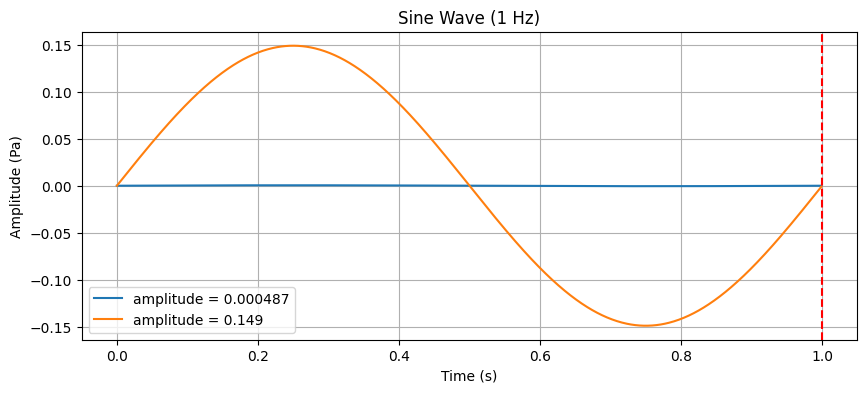

In [38]:
import numpy as np
import matplotlib.pyplot as plt

# Time parameters
duration = 1  # seconds
sample_rate = 1000     # sampling rate (samples/second)
t = np.linspace(0, duration, int(sample_rate * duration), endpoint=False)

# Signal parameters
frequency = 1  # Hz
amplitude1 = 0.000487 # Pa
amplitude2 = 0.149 # Pa

# Generate sine wave
sine_wave = amplitude1 * np.sin(2 * np.pi * frequency * t)
sine_wave2 = amplitude2 * np.sin(2 * np.pi * frequency * t)

# Plot
fig, ax = plt.subplots(figsize=(10, 4))

ax.plot(t, sine_wave, label=f'amplitude = {amplitude1}')
ax.plot(t, sine_wave2, label=f'amplitude = {amplitude2}')
ax.axvline(x=1.0, color='r', linestyle="--")

plt.title(f'Sine Wave ({frequency} Hz)')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude (Pa)')
plt.grid(True)
plt.legend()
# plt.savefig(f"{path_to_save}/amplitude_2.png")
plt.show()

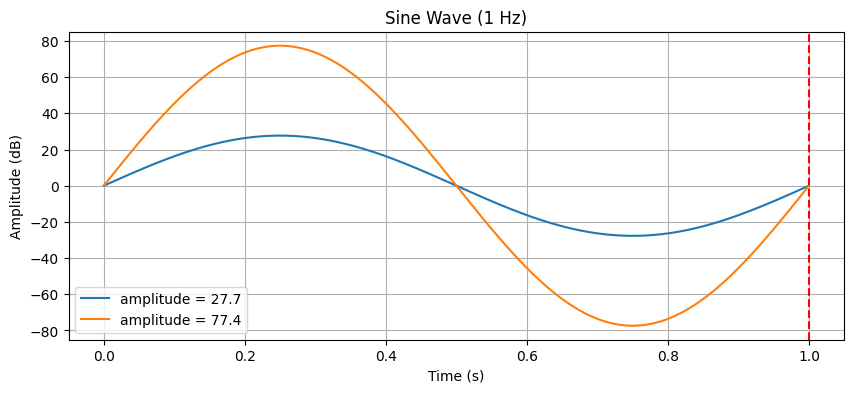

In [39]:
import numpy as np
import matplotlib.pyplot as plt

# Time parameters
duration = 1  # seconds
sample_rate = 1000     # sampling rate (samples/second)
t = np.linspace(0, duration, int(sample_rate * duration), endpoint=False)

# Signal parameters
frequency = 1  # Hz
amplitude1 = round(pascal_to_decibels(0.000487), 1) # dB
amplitude2 = round(pascal_to_decibels(0.149),1) # dB

# Generate sine wave
sine_wave = amplitude1 * np.sin(2 * np.pi * frequency * t)
sine_wave2 = amplitude2 * np.sin(2 * np.pi * frequency * t)

# Plot
fig, ax = plt.subplots(figsize=(10, 4))

ax.plot(t, sine_wave, label=f'amplitude = {amplitude1}')
ax.plot(t, sine_wave2, label=f'amplitude = {amplitude2}')
ax.axvline(x=1.0, color='r', linestyle="--")

plt.title(f'Sine Wave ({frequency} Hz)')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude (dB)')
plt.grid(True)
plt.legend()
# plt.savefig(f"{path_to_save}/amplitude_2.png")
plt.show()

### Energy, Power, Intensity

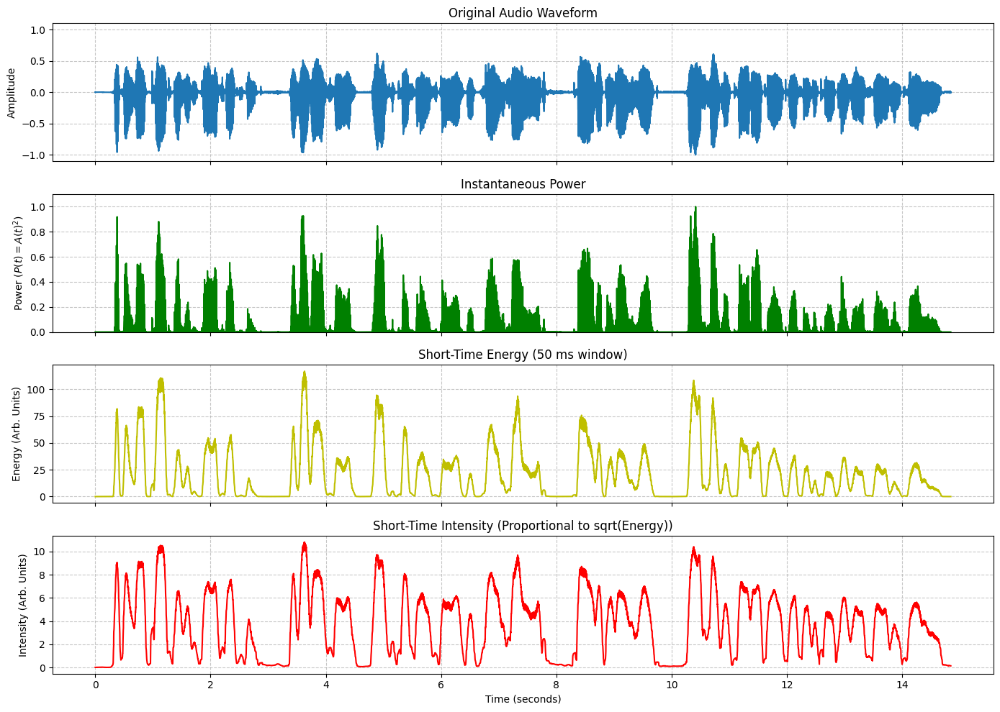

In [40]:
import numpy as np
from scipy.io import wavfile
import matplotlib.pyplot as plt

# Загрузка аудиофайла
sample_rate, audio_data = wavfile.read('speech.wav')

# Если аудио стерео, преобразуем его в моно, усреднив каналы
if audio_data.ndim > 1:
    audio_data = audio_data.mean(axis=1)

# Нормализуем данные до диапазона [-1, 1] (предполагая 16-битный PCM)
audio_data = audio_data / np.max(np.abs(audio_data))

# Создаем массив временных меток
length_in_seconds = len(audio_data) / sample_rate
time_axis = np.linspace(0., length_in_seconds, len(audio_data))

# 1. РАСЧЕТ МГНОВЕННОЙ МОЩНОСТИ (Instantaneous Power)
# Мгновенная мощность пропорциональна квадрату амплитуды сигнала в каждой точке.
# P(t) = x(t)^2
instantaneous_power = audio_data ** 2

# 2. РАСЧЕТ КРАТКОВРЕМЕННОЙ ЭНЕРГИИ (Short-Time Energy)
# Энергия на небольшом временном интервале (окне).
# Это скользящая сумма мгновенной мощности.
window_size_ms = 50  # Размер окна в миллисекундах (можно настроить)
window_size_samples = int(sample_rate * window_size_ms / 1000)

# Чтобы массив имел такую же длину, используем 'same' режим свертки
short_time_energy = np.convolve(instantaneous_power, np.ones(window_size_samples), mode='same')

# 3. РАСЧЕТ КРАТКОВРЕМЕННОЙ ИНТЕНСИВНОСТИ (Short-Time Intensity)
# Интенсивность - это Мощность на единицу площади.
# Для простоты мы можем считать ее proportional to средней мощности в окне.
# Чтобы получить значения в сопоставимом масштабе, возьмем корень из энергии.
short_time_intensity = np.sqrt(short_time_energy)

# 4. ВИЗУАЛИЗАЦИЯ
fig, ax = plt.subplots(4, 1, figsize=(14, 10), sharex=True)

# График 1: Исходный аудиосигнал
ax[0].plot(time_axis, audio_data)
ax[0].set_ylabel('Amplitude')
ax[0].set_title('Original Audio Waveform')
ax[0].grid(True, linestyle='--', alpha=0.7)
ax[0].set_ylim(-1.1, 1.1)

# График 2: Мгновенная Мощность
ax[1].plot(time_axis, instantaneous_power, color='g')
ax[1].set_ylabel('Power ($P(t) = A(t)^2$)')
ax[1].set_title('Instantaneous Power')
ax[1].grid(True, linestyle='--', alpha=0.7)
ax[1].set_ylim(0, 1.1)

# График 3: Кратковременная Энергия
ax[2].plot(time_axis, short_time_energy, c='y')
ax[2].set_ylabel('Energy (Arb. Units)')
ax[2].set_title(f'Short-Time Energy ({window_size_ms} ms window)')
ax[2].grid(True, linestyle='--', alpha=0.7)

# График 4: Кратковременная Интенсивность
ax[3].plot(time_axis, short_time_intensity, c='r')
ax[3].set_ylabel('Intensity (Arb. Units)')
ax[3].set_xlabel('Time (seconds)')
ax[3].set_title(f'Short-Time Intensity (Proportional to sqrt(Energy))')
ax[3].grid(True, linestyle='--', alpha=0.7)

# Улучшаем внешний вид
plt.tight_layout()
plt.show()

### Phase

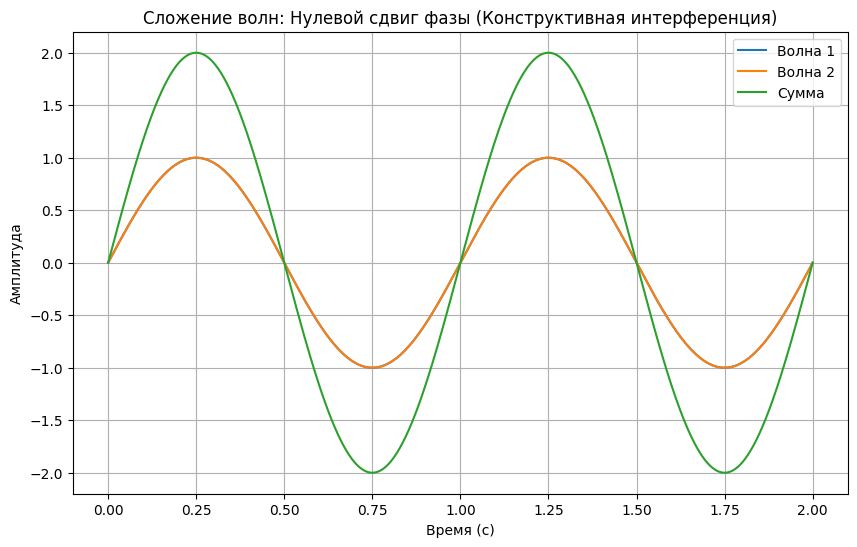

In [41]:
import numpy as np
import matplotlib.pyplot as plt

time = np.linspace(0, 2, 1000)  # 2 секунды
freq = 1  # 1 Гц
amplitude = 1
phase = 0

# Волна 1 и Волна 2 идентичны
wave1 = amplitude * np.sin(2 * np.pi * freq * time + phase)
wave2 = amplitude * np.sin(2 * np.pi * freq * time + phase)  # Фаза = 0

sum_wave = wave1 + wave2

plt.figure(figsize=(10, 6))
plt.plot(time, wave1, label='Волна 1')
plt.plot(time, wave2, label='Волна 2')
plt.plot(time, sum_wave, label='Сумма')
plt.title('Сложение волн: Нулевой сдвиг фазы (Конструктивная интерференция)')
plt.xlabel('Время (с)')
plt.ylabel('Амплитуда')
plt.legend()
plt.grid(True)
plt.show()

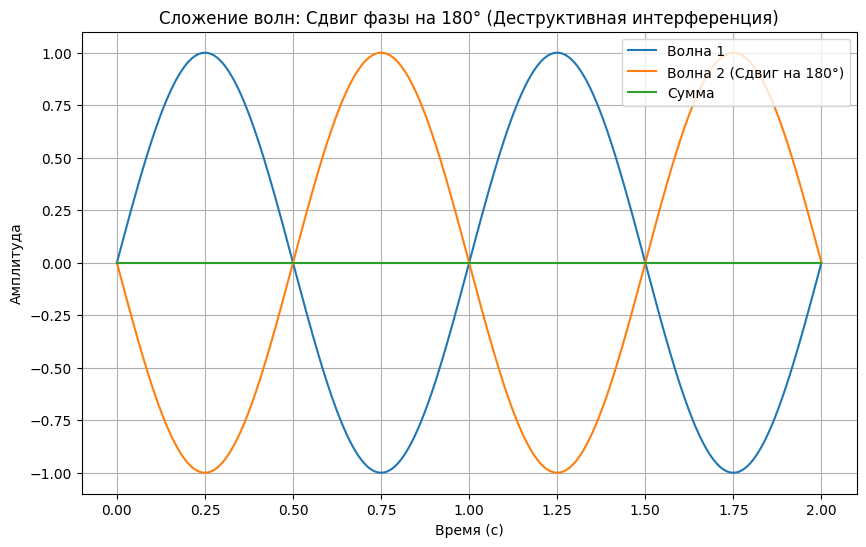

In [42]:
# Волна 2 сдвинута на 180 градусов (π радиан)
phase_shift = np.pi  # 180 degrees
wave2_opposite = amplitude * np.sin(2 * np.pi * freq * time + phase_shift)

sum_wave_destructive = wave1 + wave2_opposite

plt.figure(figsize=(10, 6))
plt.plot(time, wave1, label='Волна 1')
plt.plot(time, wave2_opposite, label='Волна 2 (Сдвиг на 180°)')
plt.plot(time, sum_wave_destructive, label='Сумма')
plt.title('Сложение волн: Сдвиг фазы на 180° (Деструктивная интерференция)')
plt.xlabel('Время (с)')
plt.ylabel('Амплитуда')
plt.legend()
plt.grid(True)
plt.show()

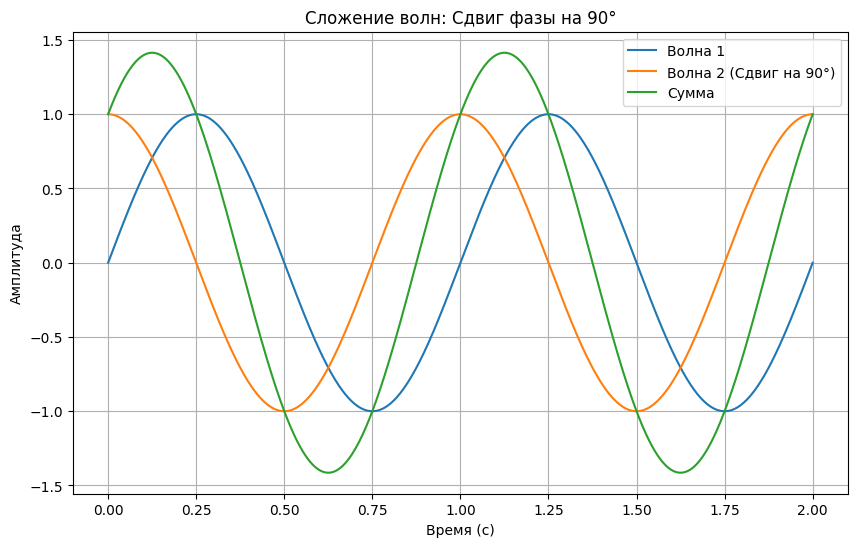

In [43]:
# Волна 2 сдвинута на 90 градусов (π/2 радиан)
phase_shift_90 = np.pi / 2  # 90 degrees
wave2_shifted = amplitude * np.sin(2 * np.pi * freq * time + phase_shift_90)

sum_wave_90 = wave1 + wave2_shifted

plt.figure(figsize=(10, 6))
plt.plot(time, wave1, label='Волна 1')
plt.plot(time, wave2_shifted, label='Волна 2 (Сдвиг на 90°)')
plt.plot(time, sum_wave_90, label='Сумма')
plt.title('Сложение волн: Сдвиг фазы на 90°')
plt.xlabel('Время (с)')
plt.ylabel('Амплитуда')
plt.legend()
plt.grid(True)
plt.show()

#### Реальный пример: Шумоподавляющие наушники

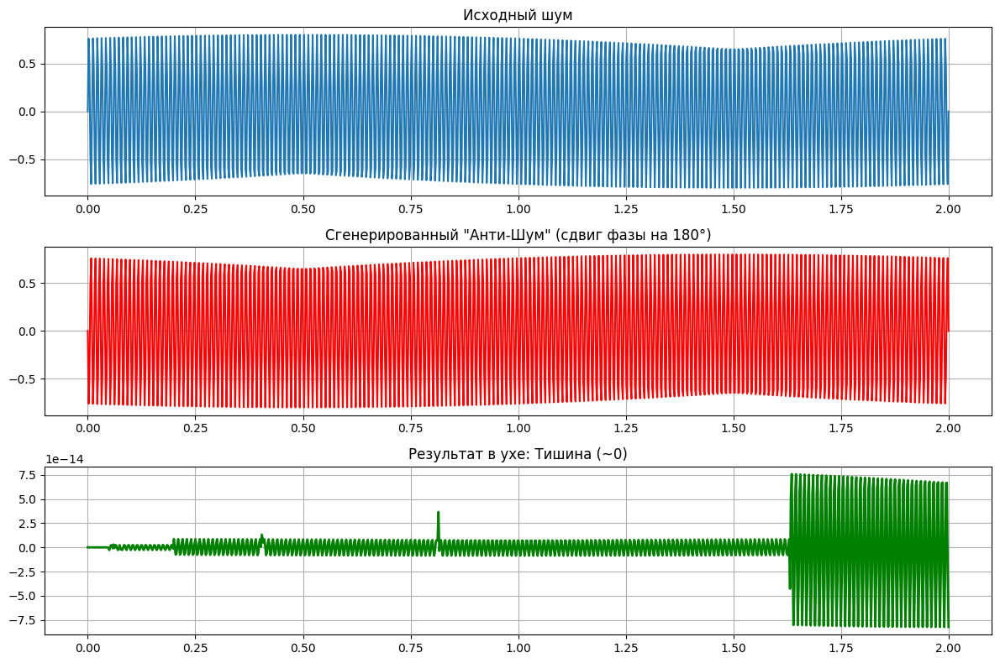

In [44]:
# Упрощенная симуляция работы шумодава
time = np.linspace(0, 2, 1000)
noise_freq = 100  # Гудение в 100 Гц
noise_amp = 0.8

# Шум (например, гул двигателя)
noise_wave = noise_amp * np.sin(2 * np.pi * noise_freq * time)
# Анти-шум (та же частота и амплитуда, но сдвиг на 180°)
anti_noise = noise_amp * np.sin(2 * np.pi * noise_freq * time + np.pi)

# Что доходит до уха
result_in_ear = noise_wave + anti_noise

# Визуализация
plt.figure(figsize=(12, 8))
plt.subplot(3, 1, 1)
plt.plot(time, noise_wave)
plt.title('Исходный шум')
plt.grid(True)

plt.subplot(3, 1, 2)
plt.plot(time, anti_noise, color='red')
plt.title('Сгенерированный "Анти-Шум" (сдвиг фазы на 180°)')
plt.grid(True)

plt.subplot(3, 1, 3)
plt.plot(time, result_in_ear, color='green', linewidth=2)
plt.title('Результат в ухе: Тишина (~0)')
plt.grid(True)

plt.tight_layout()
plt.show()

## Discretization

### Shannon-Niquest Theorem and Aliasing

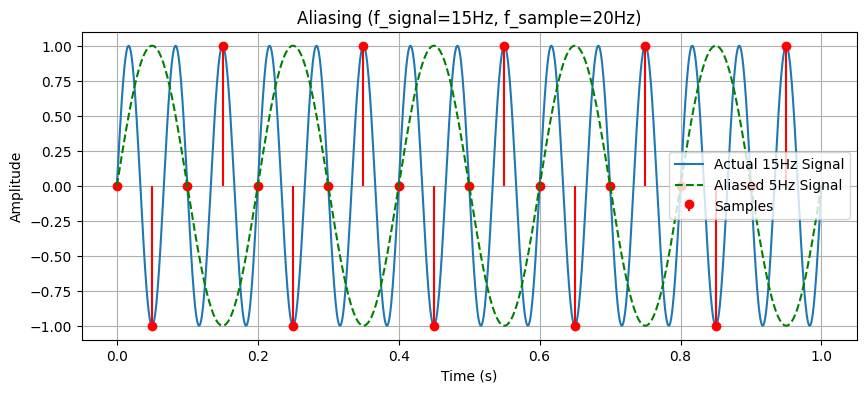

In [45]:
f_signal = 15  # Hz
f_sample = 20  # Hz (below Nyquist: 20 < 2×15)

t_continuous = np.linspace(0, 1, 1000)
t_samples = np.arange(0, 1, 1/f_sample)

analog_signal = np.sin(2 * np.pi * f_signal * t_continuous)
sampled_signal = np.sin(2 * np.pi * f_signal * t_samples)

# What we would reconstruct (aliased frequency)
aliased_freq = abs(f_sample - f_signal)  # 5Hz

plt.figure(figsize=(10, 4))
plt.plot(t_continuous, analog_signal, label='Actual 15Hz Signal')
plt.stem(t_samples, sampled_signal, 'r', markerfmt='ro', basefmt=" ", label='Samples')
plt.plot(t_continuous, np.sin(2 * np.pi * aliased_freq * t_continuous), 'g--',
         label=f'Aliased {aliased_freq}Hz Signal')
plt.title(f'Aliasing (f_signal={f_signal}Hz, f_sample={f_sample}Hz)')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.legend()
plt.grid()
plt.show()